<a href="https://colab.research.google.com/github/NathanaelGracedo/PCVK_2025/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## D1. Praktikum Deteksi Obyek Dasar

In [21]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Implementasikan 6 metode template matching pada OpenCV dengan menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

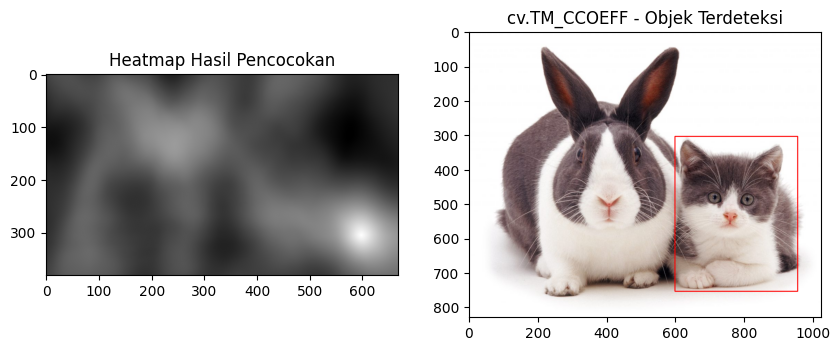

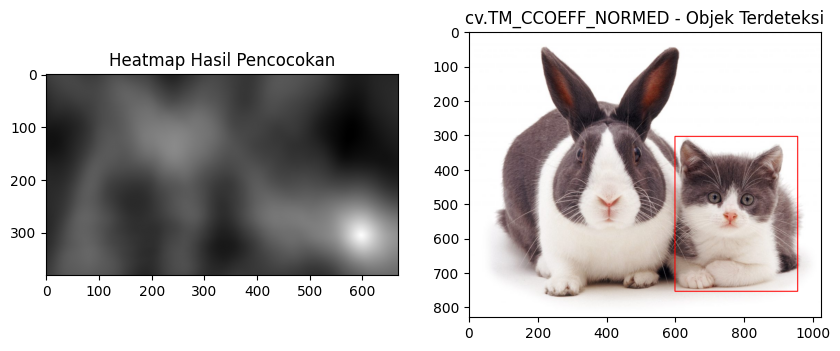

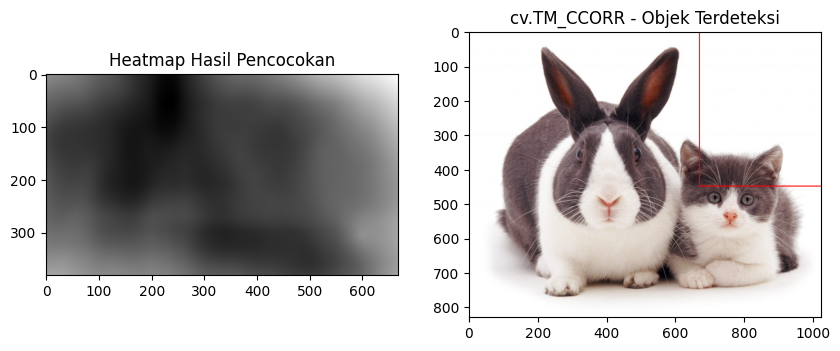

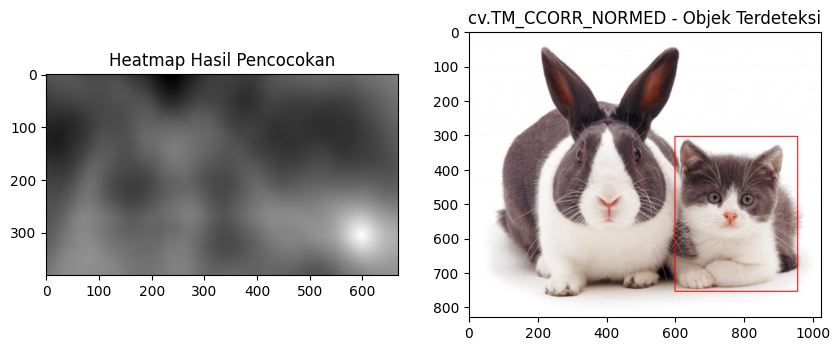

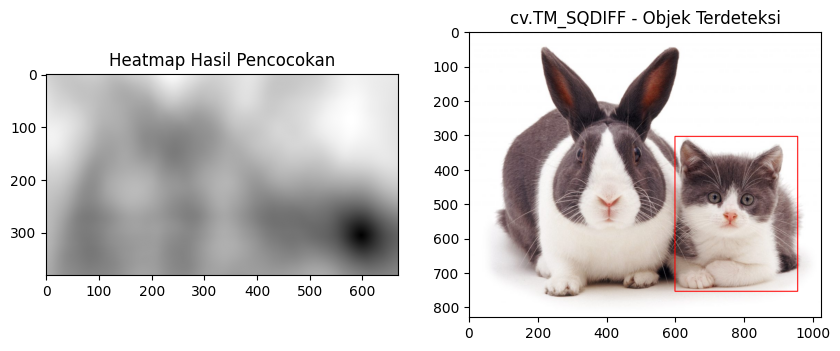

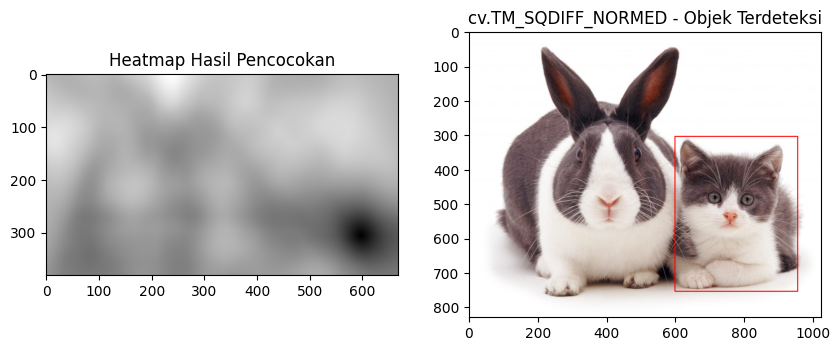

In [4]:
main_image_color = cv.imread('/content/drive/MyDrive/PCVK_img/cats_and_bunnies.jpg')
main_image_gray = cv.cvtColor(main_image_color, cv.COLOR_BGR2GRAY)

template_image_gray = cv.imread('/content/drive/MyDrive/PCVK_img/cat2_templatejpg.jpg', 0)

template_width, template_height = template_image_gray.shape[::-1]

# Mendefinisikan enam metode pencocokan template yang akan digunakan
matching_methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
                    'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for method_name_str in matching_methods:
    image_to_process_gray = main_image_gray.copy()
    current_method = eval(method_name_str)

    # Melakukan pencocokan template menggunakan metode saat ini
    match_result = cv.matchTemplate(image_to_process_gray, template_image_gray, current_method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(match_result)

    # Menentukan sudut kiri atas (top-left) dari lokasi objek yang terdeteksi.
    # Untuk metode SQDIFF, nilai minimum menunjukkan kecocokan terbaik.
    # Untuk metode lainnya, nilai maksimum menunjukkan kecocokan terbaik.
    if current_method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left_corner = min_loc
    else:
        top_left_corner = max_loc

    bottom_right_corner = (top_left_corner[0] + template_width, top_left_corner[1] + template_height)

    # Menggambar persegi panjang di sekitar objek yang terdeteksi pada gambar berwarna
    image_with_detection = main_image_color.copy()
    cv.rectangle(image_with_detection, top_left_corner, bottom_right_corner, (0, 0, 255), 2)

    # Menampilkan hasil pencocokan (heatmap) dan gambar dengan objek yang terdeteksi
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(match_result, cmap='gray')
    plt.title('Heatmap Hasil Pencocokan')

    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(image_with_detection, cv.COLOR_BGR2RGB))
    plt.title(f'{method_name_str} - Objek Terdeteksi')

    plt.show()

### Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:

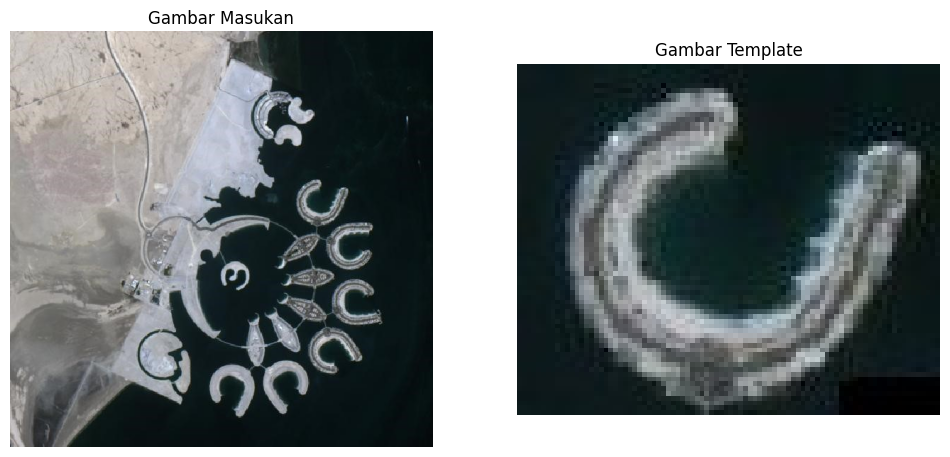

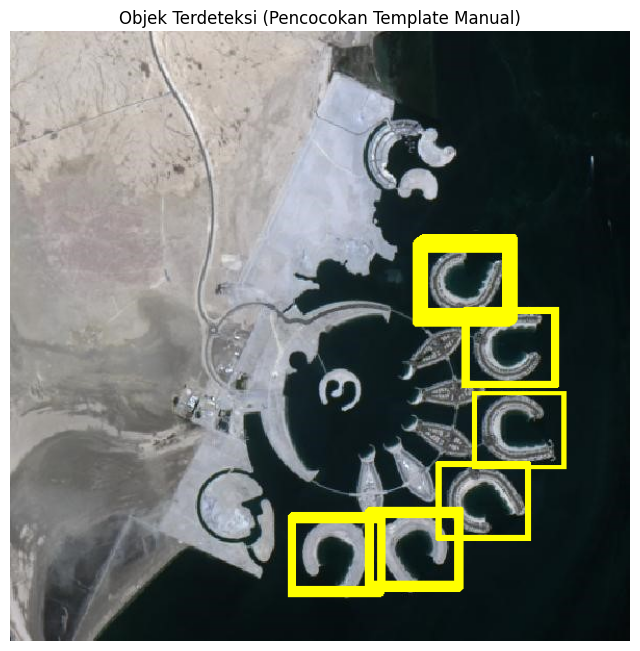

In [8]:
from PIL import Image, ImageDraw
import numpy as np
from scipy.signal import correlate2d
import matplotlib.pyplot as plt

jalur_gambar_utama = '/content/drive/MyDrive/PCVK_img/bahrain.jpg'
jalur_gambar_template = '/content/drive/MyDrive/PCVK_img/bahrain-template.jpg'

gambar_rgb_utama = Image.open(jalur_gambar_utama).convert('RGB')
gambar_rgb_template = Image.open(jalur_gambar_template).convert('RGB')

gambar_abu_abu_utama = np.array(gambar_rgb_utama.convert('L'), dtype=np.float32)
gambar_abu_abu_template = np.array(gambar_rgb_template.convert('L'), dtype=np.float32)

tinggi_template, lebar_template = gambar_abu_abu_template.shape

# Menghitung korelasi silang ternormalisasi untuk menemukan kecocokan template
rata_rata_template = gambar_abu_abu_template - np.mean(gambar_abu_abu_template)
hasil_korelasi = correlate2d(gambar_abu_abu_utama, rata_rata_template, mode='valid')

# Normalisasi hasil korelasi ke rentang 0-1
hasil_korelasi_normalisasi = (hasil_korelasi - np.min(hasil_korelasi)) / (np.max(hasil_korelasi) - np.min(hasil_korelasi))

# Menentukan nilai ambang batas untuk deteksi objek (semakin rendah, semakin sensitif)
nilai_ambang_batas = 0.69
koordinat_y, koordinat_x = np.where(hasil_korelasi_normalisasi >= nilai_ambang_batas)

gambar_hasil_deteksi = gambar_rgb_utama.copy()
objek_gambar = ImageDraw.Draw(gambar_hasil_deteksi)

# Menggambar persegi panjang di sekitar setiap objek yang terdeteksi
for (pos_x, pos_y) in zip(koordinat_x, koordinat_y):
    objek_gambar.rectangle([pos_x, pos_y, pos_x + lebar_template, pos_y + tinggi_template], outline="yellow", width=3)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(gambar_rgb_utama)
plt.title('Gambar Masukan')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gambar_rgb_template)
plt.title('Gambar Template')
plt.axis('off')
plt.show()

plt.figure(figsize=(8, 8))
plt.imshow(gambar_hasil_deteksi)
plt.title('Objek Terdeteksi (Pencocokan Template Manual)')
plt.axis('off')
plt.show()

### Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

**Sobel Edge Detection**

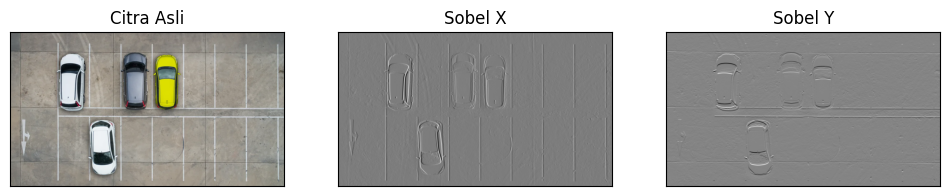

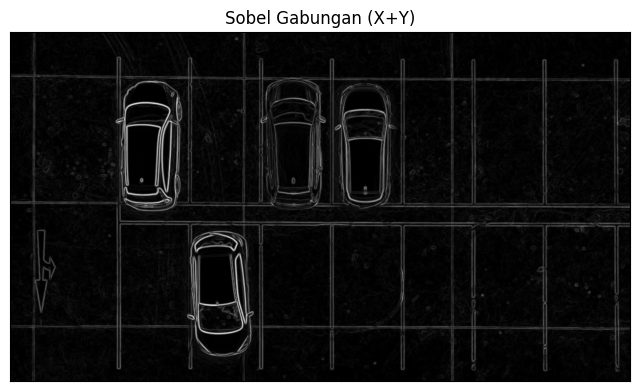

In [9]:
jalur_citra_input = '/content/drive/MyDrive/PCVK_img/car-park.jpg'
citra_berwarna = cv.imread(jalur_citra_input)
citra_grayscale = cv.imread(jalur_citra_input, cv.IMREAD_GRAYSCALE)

if citra_grayscale is None:
    print("Error: Citra tidak dapat dimuat.")
else:
    # Menghitung gradien Sobel pada arah X
    gradien_sobel_x = cv.Sobel(citra_grayscale, cv.CV_64F, 1, 0, ksize=5)
    # Menghitung gradien Sobel pada arah Y
    gradien_sobel_y = cv.Sobel(citra_grayscale, cv.CV_64F, 0, 1, ksize=5)

    # Menggabungkan gradien X dan Y untuk mendapatkan deteksi tepi keseluruhan
    deteksi_tepi_sobel_gabungan = np.sqrt(gradien_sobel_x**2 + gradien_sobel_y**2)

    # Menampilkan citra asli dan komponen Sobel X, Sobel Y
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1), plt.imshow(cv.cvtColor(citra_berwarna, cv.COLOR_BGR2RGB))
    plt.title('Citra Asli'), plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 2), plt.imshow(gradien_sobel_x, cmap='gray')
    plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 3), plt.imshow(gradien_sobel_y, cmap='gray')
    plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
    plt.show()

    # Menampilkan hasil gabungan deteksi tepi Sobel
    plt.figure(figsize=(8, 6))
    plt.imshow(deteksi_tepi_sobel_gabungan, cmap='gray')
    plt.title('Sobel Gabungan (X+Y)'), plt.xticks([]), plt.yticks([])
    plt.show()

**Canny Edge Detection**

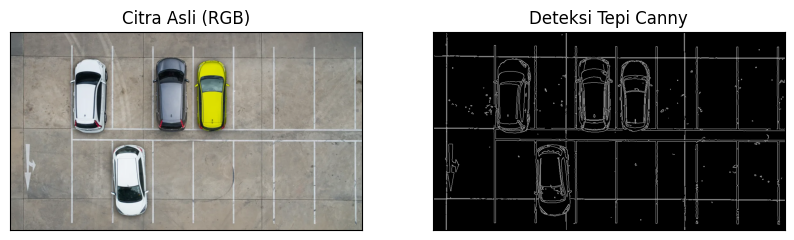

In [10]:
# Melakukan Deteksi Tepi Canny pada citra grayscale
tepi_canny = cv.Canny(citra_grayscale, 100, 200) # Ambang batas (100, 200) dapat disesuaikan sesuai kebutuhan

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(citra_berwarna, cv.COLOR_BGR2RGB))
plt.title('Citra Asli (RGB)')
plt.xticks([])
plt.yticks([])

plt.subplot(1, 2, 2)
plt.imshow(tepi_canny, cmap='gray')
plt.title('Deteksi Tepi Canny')
plt.xticks([])
plt.yticks([])
plt.show()

**Laplacian Edge Detection**

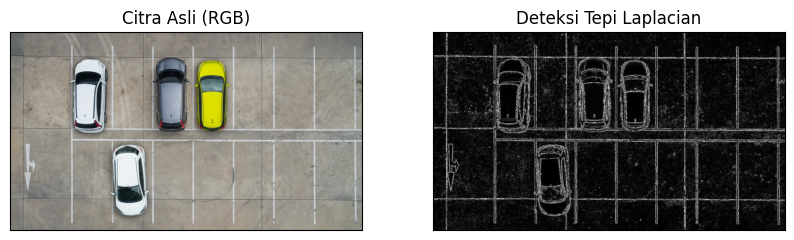

In [11]:
# Melakukan Deteksi Tepi Laplacian pada citra grayscale.
# Menggunakan cv.CV_64F untuk ddepth agar dapat menangani gradien negatif,
# dan ksize=3 sebagai ukuran kernel Laplacian.
tepi_laplacian = cv.Laplacian(citra_grayscale, cv.CV_64F, ksize=3)

# Mengubah hasil Laplacian ke nilai absolut dan mengonversi ke tipe data 8-bit unsigned integer
# agar dapat ditampilkan dengan benar sebagai gambar.
tepi_laplacian_untuk_tampil = np.uint8(np.absolute(tepi_laplacian))

# Menampilkan citra asli dan hasil deteksi tepi Laplacian
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(citra_berwarna, cv.COLOR_BGR2RGB))
plt.title('Citra Asli (RGB)')
plt.xticks([])
plt.yticks([])

plt.subplot(1, 2, 2)
plt.imshow(tepi_laplacian_untuk_tampil, cmap='gray')
plt.title('Deteksi Tepi Laplacian')
plt.xticks([])
plt.yticks([])
plt.show()

### Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chessboard.jpg, sehingga menghasilkan luaran sebagai berikut:

**Harris Corner Detection**

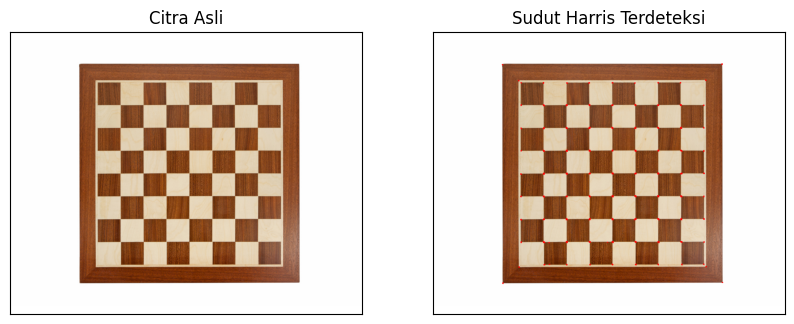

In [12]:
jalur_citra_papan_catur = '/content/drive/MyDrive/PCVK_img/chess-board.jpg'
citra_asli = cv.imread(jalur_citra_papan_catur)
citra_abu_abu = cv.cvtColor(citra_asli, cv.COLOR_BGR2GRAY)

# Mengonversi citra grayscale ke float32, yang diperlukan oleh fungsi cornerHarris
citra_abu_abu = np.float32(citra_abu_abu)

# Menerapkan Detektor Sudut Harris
# blockSize: ukuran lingkungan yang dipertimbangkan untuk deteksi sudut
# ksize: parameter aperture dari turunan Sobel yang digunakan
# k: parameter bebas detektor Harris dalam persamaan
hasil_harris = cv.cornerHarris(citra_abu_abu, 2, 3, 0.04)

# Hasil dilasi untuk menandai sudut, ini tidak penting untuk perhitungan inti
hasil_harris = cv.dilate(hasil_harris, None)

# Menentukan ambang batas untuk menandai sudut yang optimal. Nilai ini bisa bervariasi
# tergantung pada citra. Sudut ditandai dengan warna merah.
citra_dengan_sudut = citra_asli.copy()
citra_dengan_sudut[hasil_harris > 0.01 * hasil_harris.max()] = [0, 0, 255]

# Menampilkan citra asli dan citra dengan sudut yang terdeteksi
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1), plt.imshow(cv.cvtColor(citra_asli, cv.COLOR_BGR2RGB))
plt.title('Citra Asli'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 2, 2), plt.imshow(cv.cvtColor(citra_dengan_sudut, cv.COLOR_BGR2RGB))
plt.title('Sudut Harris Terdeteksi'), plt.xticks([]), plt.yticks([])
plt.show()

**Shi-Tomasi Detection**

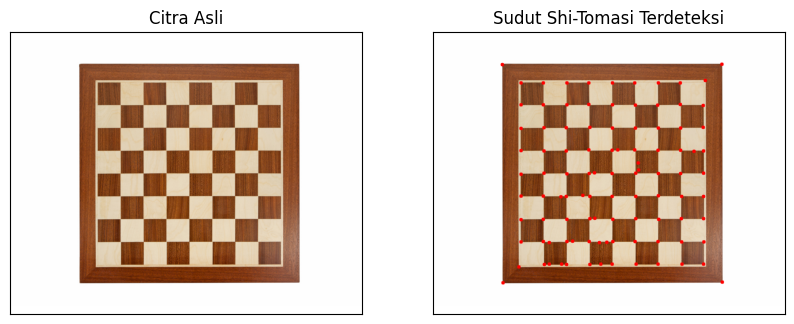

In [13]:
# Menggunakan citra abu-abu yang sudah dimuat dari sel sebelumnya untuk deteksi sudut
# citra_abu_abu berasal dari jalur_citra_papan_catur

# Menerapkan Detektor Sudut Shi-Tomasi
# maxCorners: Jumlah maksimum sudut yang ingin dideteksi.
# qualityLevel: Kualitas minimum sudut yang diterima (antara 0-1).
# minDistance: Jarak Euclidean minimum antar sudut yang terdeteksi.
sudut_terdeteksi = cv.goodFeaturesToTrack(citra_abu_abu, maxCorners=100, qualityLevel=0.01, minDistance=10)
sudut_terdeteksi = sudut_terdeteksi.astype(np.int32)

citra_dengan_sudut_shi_tomasi = citra_asli.copy()

# Menggambar lingkaran pada setiap sudut yang terdeteksi
for i in sudut_terdeteksi:
    x, y = i.ravel()
    cv.circle(citra_dengan_sudut_shi_tomasi, (x, y), 5, [0, 0, 255], -1) # Menggambar lingkaran merah

# Menampilkan citra asli dan citra dengan sudut Shi-Tomasi yang terdeteksi
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1), plt.imshow(cv.cvtColor(citra_asli, cv.COLOR_BGR2RGB))
plt.title('Citra Asli'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 2, 2), plt.imshow(cv.cvtColor(citra_dengan_sudut_shi_tomasi, cv.COLOR_BGR2RGB))
plt.title('Sudut Shi-Tomasi Terdeteksi'), plt.xticks([]), plt.yticks([])
plt.show()

### Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan teori, sehingga menghasilkan luaran sebagai berikut:

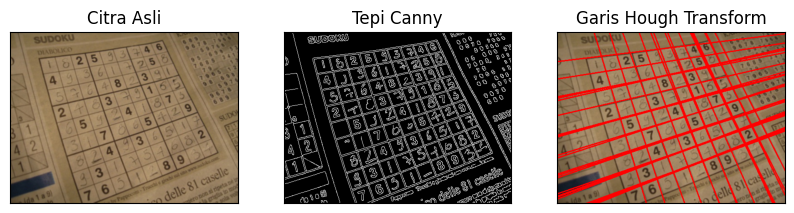

In [14]:
jalur_citra_sudoku = '/content/drive/MyDrive/PCVK_img/sudoku.jpg'
citra_asli_sudoku = cv.imread(jalur_citra_sudoku)
citra_abu_abu_sudoku = cv.cvtColor(citra_asli_sudoku, cv.COLOR_BGR2GRAY)

# Terapkan deteksi tepi Canny pada citra abu-abu
tepi_canny_sudoku = cv.Canny(citra_abu_abu_sudoku, 50, 150, apertureSize=3)

# Lakukan Transformasi Hough untuk mendeteksi garis
garis_terdeteksi = cv.HoughLines(tepi_canny_sudoku, 1, np.pi/180, 163)

# Buat salinan citra asli untuk menggambar garis yang terdeteksi
citra_dengan_garis_hough = citra_asli_sudoku.copy()

# Gambar garis-garis yang terdeteksi pada citra
if garis_terdeteksi is not None:
  for baris_hough in garis_terdeteksi:
      rho, theta = baris_hough[0]
      # Konversi parameter Hough (rho, theta) ke koordinat kartesian untuk menggambar garis
      a = np.cos(theta)
      b = np.sin(theta)
      x0 = a * rho
      y0 = b * rho
      x1 = int(x0 + 1000 * (-b))
      y1 = int(y0 + 1000 * (a))
      x2 = int(x0 - 1000 * (-b))
      y2 = int(y0 - 1000 * (a))
      cv.line(citra_dengan_garis_hough, (x1, y1), (x2, y2), (0, 0, 255), 2) # Menggambar garis merah

# Tampilkan citra asli, tepi Canny, dan hasil transformasi Hough
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1), plt.imshow(cv.cvtColor(citra_asli_sudoku, cv.COLOR_BGR2RGB))
plt.title('Citra Asli'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 2), plt.imshow(tepi_canny_sudoku, cmap='gray')
plt.title('Tepi Canny'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 3), plt.imshow(cv.cvtColor(citra_dengan_garis_hough, cv.COLOR_BGR2RGB))
plt.title('Garis Hough Transform'), plt.xticks([]), plt.yticks([])
plt.show()

### Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:


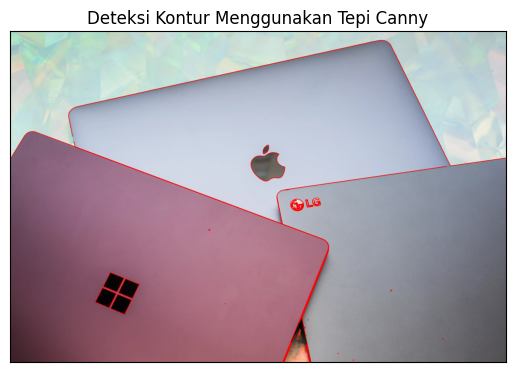

In [15]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra laptop
jalur_citra_laptop = '/content/drive/MyDrive/PCVK_img/laptop.jpg'

# Memuat citra asli dan mengkonversinya ke skala abu-abu
citra_asli_laptop = cv.imread(jalur_citra_laptop)
citra_abu_abu_laptop = cv.cvtColor(citra_asli_laptop, cv.COLOR_BGR2GRAY)

# Menerapkan deteksi tepi Canny pada citra abu-abu
# Ambang batas (60, 180) dapat disesuaikan untuk hasil yang optimal
tepi_canny_laptop = cv.Canny(citra_abu_abu_laptop, 60, 180)

# Menemukan kontur pada citra tepi
# cv.RETR_TREE untuk hierarki penuh, cv.CHAIN_APPROX_SIMPLE untuk kompresi kontur
daftar_kontur, struktur_hierarki = cv.findContours(tepi_canny_laptop, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

# Menggambar kontur yang terdeteksi pada salinan citra asli
citra_dengan_kontur = citra_asli_laptop.copy()
cv.drawContours(citra_dengan_kontur, daftar_kontur, -1, (0, 0, 255), 3) # Menggambar semua kontur dengan warna merah dan ketebalan 3

# Menampilkan citra hasil deteksi kontur
plt.imshow(cv.cvtColor(citra_dengan_kontur, cv.COLOR_BGR2RGB))
plt.title('Deteksi Kontur Menggunakan Tepi Canny')
plt.xticks([]), plt.yticks([])
plt.show()

## D2. Praktikum Feature Matching dan Face Detection

### Lakukan Face Detection untuk image object lain yang tersedia pada (/images/facedet). Tampilkan seperti pada contoh berikut:

**Citra Presiden Jokowi**

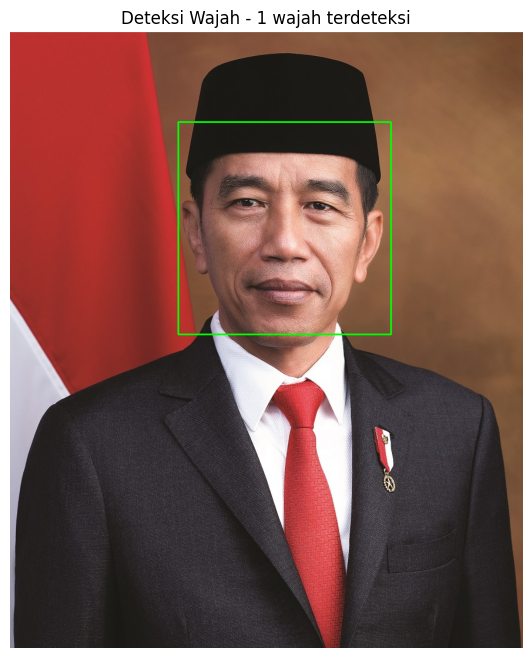

In [23]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra yang akan dideteksi wajahnya
jalur_citra_wajah = '/content/drive/MyDrive/PCVK_img/facedet/jokowi.jpg'

# Memuat cascade classifier untuk deteksi wajah bagian depan
pendeteksi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Membaca citra dan mengonversinya ke skala abu-abu untuk deteksi
citra_input = cv.imread(jalur_citra_wajah)
citra_abu_abu_wajah = cv.cvtColor(citra_input, cv.COLOR_BGR2GRAY)

# Melakukan deteksi wajah pada citra abu-abu
hasil_deteksi_wajah = pendeteksi_wajah.detectMultiScale(citra_abu_abu_wajah, 1.3, 5)

# Menggambar persegi panjang di sekitar setiap wajah yang terdeteksi
for (pos_x, pos_y, lebar, tinggi) in hasil_deteksi_wajah:
    cv.rectangle(citra_input, (pos_x, pos_y), (pos_x + lebar, pos_y + tinggi), (0, 255, 0), 2)

# Mengonversi citra dari format BGR ke RGB untuk tampilan yang benar di Matplotlib
citra_output_rgb = cv.cvtColor(citra_input, cv.COLOR_BGR2RGB)

# Menampilkan citra dengan wajah yang terdeteksi
plt.figure(figsize=(10, 8))
plt.imshow(citra_output_rgb)
plt.axis('off')
plt.title(f'Deteksi Wajah - {len(hasil_deteksi_wajah)} wajah terdeteksi')
plt.show()

**Citra Kartini**

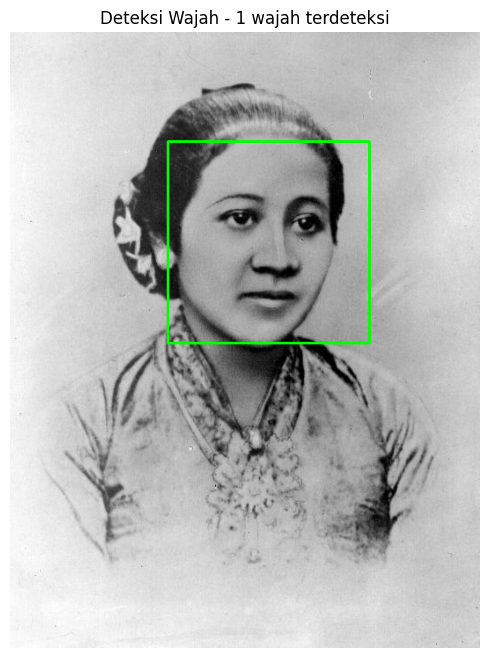

In [25]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra Kartini untuk deteksi wajah
path_citra_kartini = '/content/drive/MyDrive/PCVK_img/facedet/kartini.jpg'

# Memuat cascade classifier untuk deteksi wajah bagian depan
alat_deteksi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Membaca citra dan mengonversinya ke skala abu-abu untuk proses deteksi
citra_gambar = cv.imread(path_citra_kartini)

# Memastikan gambar berhasil dimuat sebelum diproses
if citra_gambar is None:
    print(f"Error: Gagal memuat gambar dari {path_citra_kartini}.")
else:
    citra_abu_abu_deteksi = cv.cvtColor(citra_gambar, cv.COLOR_BGR2GRAY)

    # Melakukan deteksi wajah pada citra abu-abu dengan skala dan jumlah tetangga minimum
    daftar_wajah_terdeteksi = alat_deteksi_wajah.detectMultiScale(citra_abu_abu_deteksi, 1.3, 5)

    # Menggambar persegi panjang di sekitar setiap wajah yang terdeteksi
    for (pos_x, pos_y, lebar, tinggi) in daftar_wajah_terdeteksi:
        cv.rectangle(citra_gambar, (pos_x, pos_y), (pos_x + lebar, pos_y + tinggi), (0, 255, 0), 2)

    # Mengonversi citra dari format BGR ke RGB untuk tampilan yang benar di Matplotlib
    citra_hasil_rgb = cv.cvtColor(citra_gambar, cv.COLOR_BGR2RGB)

    # Menampilkan citra dengan wajah yang terdeteksi
    plt.figure(figsize=(10, 8))
    plt.imshow(citra_hasil_rgb)
    plt.axis('off')
    plt.title(f'Deteksi Wajah - {len(daftar_wajah_terdeteksi)} wajah terdeteksi')
    plt.show()

**Citra Kucing**

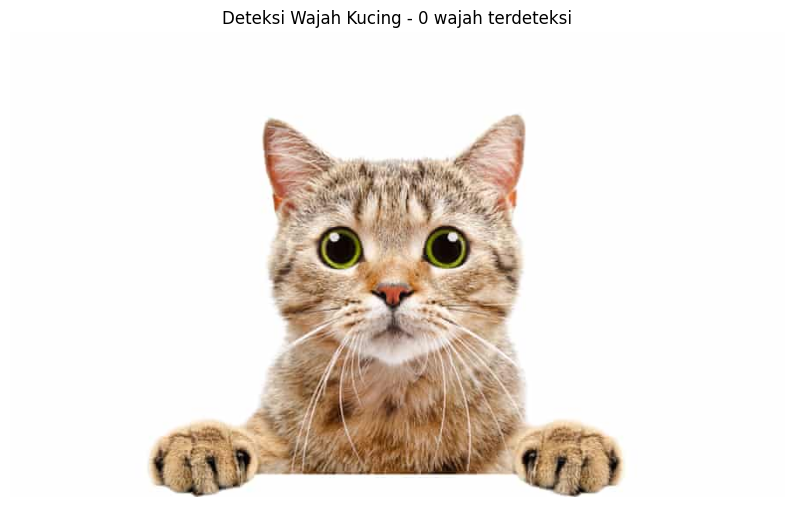

In [26]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra kucing untuk deteksi wajah
jalur_citra_kucing = '/content/drive/MyDrive/PCVK_img/facedet/kucing.jpg'

# Memuat cascade classifier untuk deteksi wajah
klasifikasi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Membaca citra dan mengonversinya ke skala abu-abu untuk deteksi
citra_kucing = cv.imread(jalur_citra_kucing)
citra_abu_abu_kucing = cv.cvtColor(citra_kucing, cv.COLOR_BGR2GRAY)

# Melakukan deteksi wajah pada citra abu-abu
hasil_deteksi_wajah_kucing = klasifikasi_wajah.detectMultiScale(citra_abu_abu_kucing, 1.3, 5)

# Menggambar persegi panjang di sekitar setiap wajah yang terdeteksi
for (posisi_x, posisi_y, lebar_wajah, tinggi_wajah) in hasil_deteksi_wajah_kucing:
    cv.rectangle(citra_kucing, (posisi_x, posisi_y), (posisi_x + lebar_wajah, posisi_y + tinggi_wajah), (0, 255, 0), 2)

# Mengonversi citra dari format BGR ke RGB untuk tampilan yang benar di Matplotlib
citra_output_rgb_kucing = cv.cvtColor(citra_kucing, cv.COLOR_BGR2RGB)

# Menampilkan citra dengan wajah yang terdeteksi
plt.figure(figsize=(10, 8))
plt.imshow(citra_output_rgb_kucing)
plt.axis('off')
plt.title(f'Deteksi Wajah Kucing - {len(hasil_deteksi_wajah_kucing)} wajah terdeteksi')
plt.show()

**Citra mask**

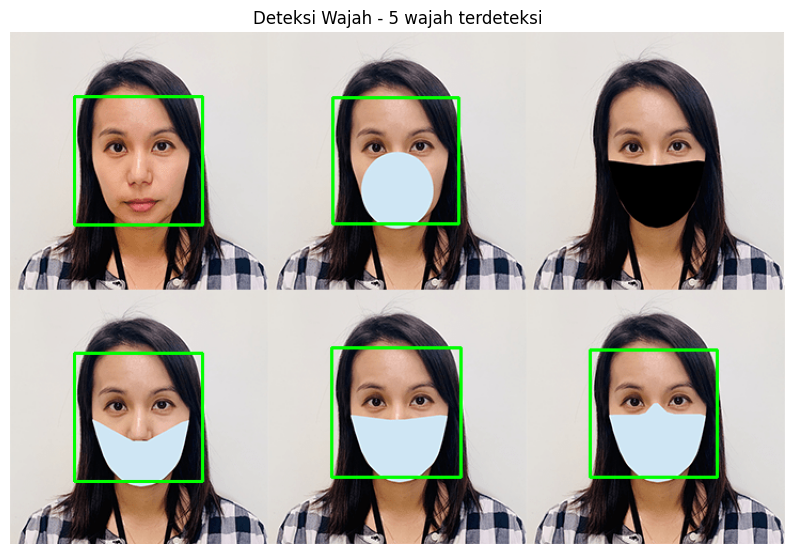

In [27]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra yang akan diproses
jalur_citra = '/content/drive/MyDrive/PCVK_img/facedet/mask.png'

# Memuat cascade classifier untuk deteksi wajah depan
klasifikasi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Membaca citra dan mengonversinya ke skala abu-abu untuk deteksi
citra_input = cv.imread(jalur_citra)
citra_abu_abu = cv.cvtColor(citra_input, cv.COLOR_BGR2GRAY)

# Melakukan deteksi wajah pada citra abu-abu
hasil_deteksi_wajah = klasifikasi_wajah.detectMultiScale(citra_abu_abu, 1.3, 5)

# Menggambar persegi panjang di sekitar setiap wajah yang terdeteksi
for (posisi_x, posisi_y, lebar, tinggi) in hasil_deteksi_wajah:
    cv.rectangle(citra_input, (posisi_x, posisi_y), (posisi_x + lebar, posisi_y + tinggi), (0, 255, 0), 2)

# Mengonversi citra dari format BGR ke RGB untuk tampilan yang benar di Matplotlib
citra_tampil_rgb = cv.cvtColor(citra_input, cv.COLOR_BGR2RGB)

# Menampilkan citra dengan wajah yang terdeteksi
plt.figure(figsize=(10, 8))
plt.imshow(citra_tampil_rgb)
plt.axis('off')
plt.title(f'Deteksi Wajah - {len(hasil_deteksi_wajah)} wajah terdeteksi')
plt.show()

**Citra Michael Jordan**

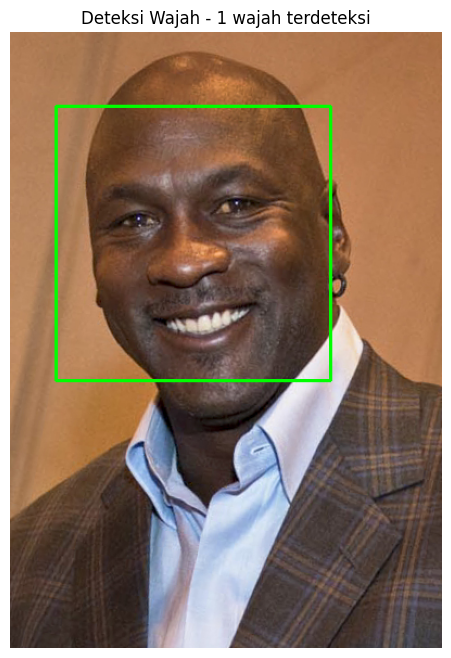

In [28]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra Michael Jordan
jalur_citra_jordan = '/content/drive/MyDrive/PCVK_img/facedet/mjordan.jpg'

# Memuat cascade classifier untuk deteksi wajah
detektor_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Membaca citra dan mengonversinya ke skala abu-abu untuk deteksi
citra_michael_jordan = cv.imread(jalur_citra_jordan)
citra_abu_abu_jordan = cv.cvtColor(citra_michael_jordan, cv.COLOR_BGR2GRAY)

# Melakukan deteksi wajah pada citra abu-abu
hasil_deteksi_wajah_jordan = detektor_wajah.detectMultiScale(citra_abu_abu_jordan, 1.4, 7)

# Menggambar persegi panjang untuk setiap wajah yang terdeteksi
for (pos_x, pos_y, lebar, tinggi) in hasil_deteksi_wajah_jordan:
    cv.rectangle(citra_michael_jordan, (pos_x, pos_y), (pos_x + lebar, pos_y + tinggi), (0, 255, 0), 2)

# Mengonversi citra dari BGR ke RGB untuk tampilan yang benar di Matplotlib
citra_tampil_jordan_rgb = cv.cvtColor(citra_michael_jordan, cv.COLOR_BGR2RGB)

# Menampilkan citra dengan wajah yang terdeteksi
plt.figure(figsize=(10, 8))
plt.imshow(citra_tampil_jordan_rgb)
plt.axis('off')
plt.title(f'Deteksi Wajah - {len(hasil_deteksi_wajah_jordan)} wajah terdeteksi')
plt.show()

**Citra Konferensi Solvay**

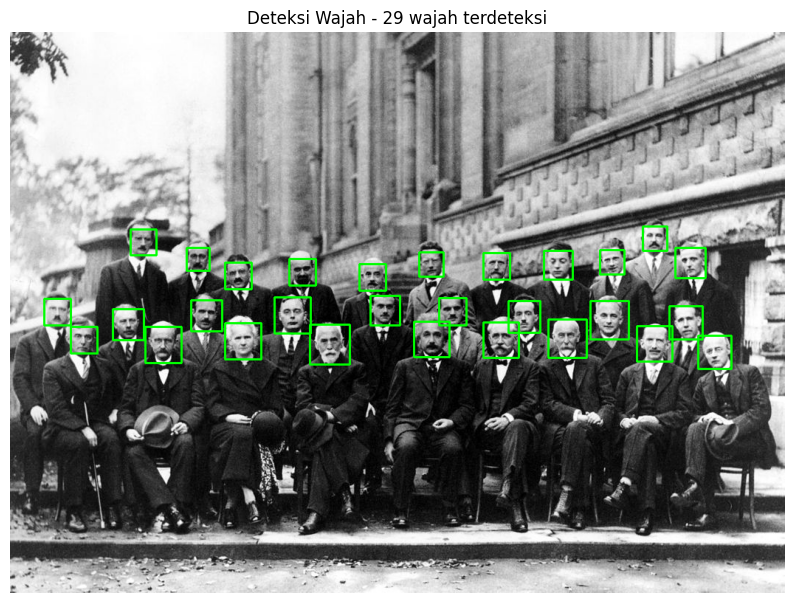

In [29]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra Konferensi Solvay
jalur_citra_konferensi = '/content/drive/MyDrive/PCVK_img/facedet/solvayconf.jpg'

# Memuat cascade classifier untuk deteksi wajah
pendeteksi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Membaca citra dan mengonversinya ke skala abu-abu untuk deteksi
citra_input = cv.imread(jalur_citra_konferensi)
citra_abu_abu = cv.cvtColor(citra_input, cv.COLOR_BGR2GRAY)

# Melakukan deteksi wajah
hasil_deteksi_wajah = pendeteksi_wajah.detectMultiScale(citra_abu_abu, 1.055, 7)

# Menggambar persegi panjang di sekitar setiap wajah yang terdeteksi
for (posisi_x, posisi_y, lebar, tinggi) in hasil_deteksi_wajah:
    cv.rectangle(citra_input, (posisi_x, posisi_y), (posisi_x + lebar, posisi_y + tinggi), (0, 255, 0), 2)

# Mengonversi citra dari format BGR ke RGB untuk tampilan yang benar di Matplotlib
citra_output_rgb = cv.cvtColor(citra_input, cv.COLOR_BGR2RGB)

# Menampilkan citra dengan wajah yang terdeteksi
plt.figure(figsize=(10, 8))
plt.imshow(citra_output_rgb)
plt.axis('off')
plt.title(f'Deteksi Wajah - {len(hasil_deteksi_wajah)} wajah terdeteksi')
plt.show()

### Pada Soal No.2. wajah kucing tidak bisa dideteksi dengan baik. Lakukan deteksi wajah kucing hingga muncul rectangle pada bagian wajahnya. Petunjuk pada soal ini, perhatikan pretrained features yang telah disediakan OpenCV. Gunakan xml yang ada jika memang telah disediakan. Jika belum ada, coba cari dengan searching melalui search engines.  

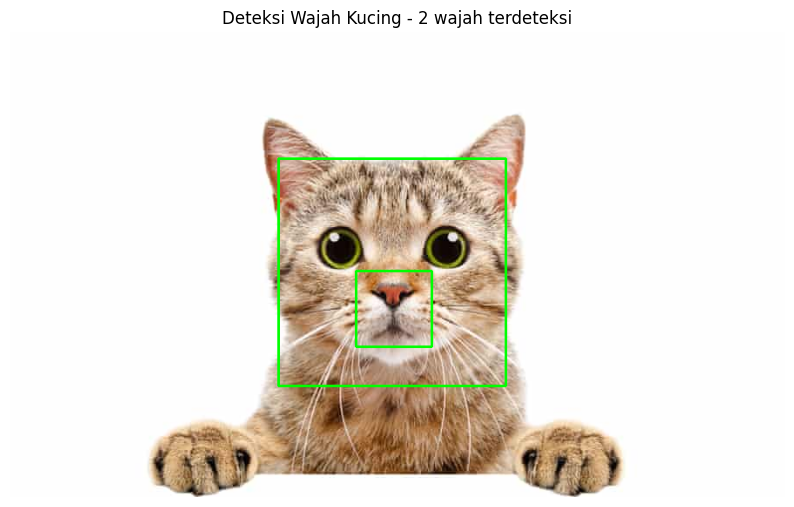

In [30]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra kucing
jalur_gambar = '/content/drive/MyDrive/PCVK_img/facedet/kucing.jpg'

# Memuat cascade classifier khusus untuk deteksi wajah kucing
pendeteksi_wajah_kucing = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalcatface.xml')

# Membaca gambar asli
gambar_asli = cv.imread(jalur_gambar)

# Mengonversi gambar ke skala abu-abu untuk deteksi
gambar_abu_abu = cv.cvtColor(gambar_asli, cv.COLOR_BGR2GRAY)

# Melakukan deteksi wajah kucing
wajah_kucing_terdeteksi = pendeteksi_wajah_kucing.detectMultiScale(
    gambar_abu_abu,
    scaleFactor=1.1,
    minNeighbors=3,
    minSize=(75, 75)
)

# Menggambar persegi panjang untuk setiap wajah kucing yang terdeteksi
for (x, y, w, h) in wajah_kucing_terdeteksi:
    cv.rectangle(gambar_asli, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Mengonversi gambar dari BGR ke RGB untuk tampilan yang benar di Matplotlib
gambar_rgb_tampil = cv.cvtColor(gambar_asli, cv.COLOR_BGR2RGB)

# Menampilkan gambar dengan wajah kucing yang terdeteksi
plt.figure(figsize=(10, 8))
plt.imshow(gambar_rgb_tampil)
plt.axis('off')
plt.title(f'Deteksi Wajah Kucing - {len(wajah_kucing_terdeteksi)} wajah terdeteksi')
plt.show()

 ### Cobakan juga untuk eyes detection pada wajah Pak Jokowi:

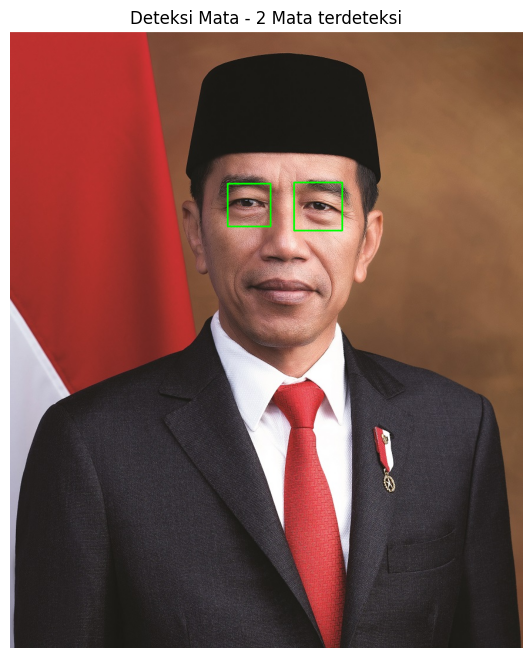

In [32]:
jalur_citra = '/content/drive/MyDrive/PCVK_img/facedet/jokowi.jpg'

# Memuat Haar Cascade untuk wajah dan mata
cascade_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')
cascade_mata = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_eye.xml')

citra_input = cv.imread(jalur_citra)
citra_abu_abu = cv.cvtColor(citra_input, cv.COLOR_BGR2GRAY)

# Deteksi wajah terlebih dahulu
wajah_terdeteksi = cascade_wajah.detectMultiScale(citra_abu_abu, 1.3, 5, minSize=(50, 50))

for (x_wajah, y_wajah, lebar_wajah, tinggi_wajah) in wajah_terdeteksi:
    # Menentukan Region of Interest (ROI) untuk deteksi mata di dalam wajah
    roi_abu_abu = citra_abu_abu[y_wajah:y_wajah+tinggi_wajah, x_wajah:x_wajah+lebar_wajah]
    roi_berwarna = citra_input[y_wajah:y_wajah+tinggi_wajah, x_wajah:x_wajah+lebar_wajah]

    # Deteksi mata dalam ROI wajah dengan parameter tuning
    mata_terdeteksi = cascade_mata.detectMultiScale(
        roi_abu_abu,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(20, 20)
    )

    # Menggambar persegi panjang di sekitar setiap mata yang terdeteksi
    for (x_mata, y_mata, lebar_mata, tinggi_mata) in mata_terdeteksi:
        cv.rectangle(roi_berwarna, (x_mata, y_mata), (x_mata+lebar_mata, y_mata+tinggi_mata), (0, 255, 0), 2)

# Konversi BGR ke RGB untuk tampilan yang benar
citra_rgb_tampil = cv.cvtColor(citra_input, cv.COLOR_BGR2RGB)

# Menampilkan gambar dengan mata yang terdeteksi
plt.figure(figsize=(10, 8))
plt.imshow(citra_rgb_tampil)
plt.axis('off')
plt.title(f'Deteksi Mata - {len(mata_terdeteksi)} Mata terdeteksi')
plt.show()

### Deteksi Senyuman

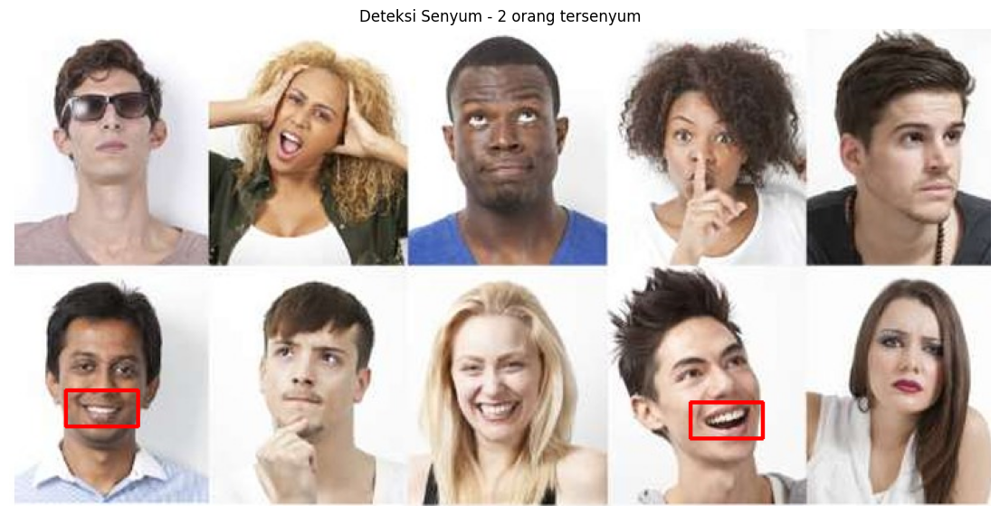

In [40]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra orang
jalur_citra_orang = '/content/drive/MyDrive/PCVK_img/facedet/people.jpg'

# Memuat cascade classifier untuk deteksi wajah dan senyuman
klasifikasi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')
klasifikasi_senyum = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_smile.xml')

# Membaca citra
citra_asli = cv.imread(jalur_citra_orang)

# Memeriksa apakah citra berhasil dimuat
if citra_asli is None:
    print(f"Error: Gagal memuat citra dari {jalur_citra_orang}. Pastikan jalur dan nama file benar.")
else:
    # Mengonversi citra ke skala abu-abu
    citra_abu_abu = cv.cvtColor(citra_asli, cv.COLOR_BGR2GRAY)

    # Melakukan deteksi wajah pada citra abu-abu
    daftar_wajah = klasifikasi_wajah.detectMultiScale(
        citra_abu_abu,
        scaleFactor=1.1,
        minNeighbors=4,
        minSize=(40, 40)
    )

    jumlah_senyum = 0

    # Iterasi melalui setiap wajah yang terdeteksi
    for (pos_x_wajah, pos_y_wajah, lebar_wajah, tinggi_wajah) in daftar_wajah:
        # Menentukan Region of Interest (ROI) untuk area mulut di dalam wajah
        pos_y_mulut = pos_y_wajah + int(tinggi_wajah * 0.5)
        tinggi_mulut = int(tinggi_wajah * 0.5)

        roi_wajah_abu_abu = citra_abu_abu[pos_y_mulut : pos_y_mulut + tinggi_mulut, pos_x_wajah : pos_x_wajah + lebar_wajah]
        roi_wajah_berwarna = citra_asli[pos_y_mulut : pos_y_mulut + tinggi_mulut, pos_x_wajah : pos_x_wajah + lebar_wajah]

        # Melakukan deteksi senyum dalam ROI mulut
        daftar_senyum = klasifikasi_senyum.detectMultiScale(
            roi_wajah_abu_abu,
            scaleFactor=1.5,
            minNeighbors=5,
            minSize=(50, 50)
        )

        # Jika senyum terdeteksi, tandai dan hitung
        if len(daftar_senyum) > 0:
            jumlah_senyum += 1

            # Mengambil senyum terbesar dan menggambar persegi panjang merah
            pos_x_senyum, pos_y_senyum, lebar_senyum, tinggi_senyum = max(daftar_senyum, key=lambda s: s[2]*s[3])
            cv.rectangle(roi_wajah_berwarna, (pos_x_senyum, pos_y_senyum), (pos_x_senyum + lebar_senyum, pos_y_senyum + tinggi_senyum), (0, 0, 255), 2)

    # Mengonversi citra akhir dari BGR ke RGB untuk tampilan yang benar
    citra_tampil_rgb = cv.cvtColor(citra_asli, cv.COLOR_BGR2RGB)

    # Menampilkan hasil deteksi senyum
    plt.figure(figsize=(14, 10))
    plt.imshow(citra_tampil_rgb)
    plt.axis('off')
    plt.title(f'Deteksi Senyum - {jumlah_senyum} orang tersenyum')
    plt.show()

### Face Tracking


                   📸 FOTO TERTANGKAP - HASIL DETEKSI WAJAH

✓ Total wajah terdeteksi: 1

🖼️  Gambar Hasil:



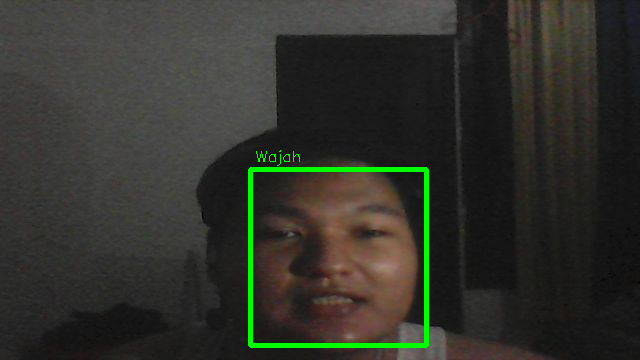

In [42]:
from IPython.display import display, Javascript, Image, clear_output
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import PIL
import io
from base64 import b64decode, b64encode

# Memuat Haar Cascade untuk deteksi wajah
pendeteksi_wajah = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Fungsi: Mengonversi data JavaScript (base64) ke gambar OpenCV
def konversi_js_ke_gambar_cv(respon_js):
    image_bytes = b64decode(respon_js.split(',')[1])
    jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
    gambar_cv = cv2.imdecode(jpg_as_np, flags=1)
    return gambar_cv

# Fungsi: Mengonversi array bounding box ke format bytes untuk overlay
def konversi_bbox_ke_bytes(array_bbox):
    bbox_PIL = PIL.Image.fromarray(array_bbox, 'RGBA')
    buffer_io = io.BytesIO()
    bbox_PIL.save(buffer_io, format='png')
    bytes_bbox = 'data:image/png;base64,{}'.format((str(b64encode(buffer_io.getvalue()), 'utf-8')))
    return bytes_bbox

# Kode JavaScript untuk streaming video dengan tombol CAPTURE
def mulai_stream_video():
    js = Javascript('''
    var elemen_video;
    var elemen_div = null;
    var aliran_media;
    var kanvas_tangkap;
    var elemen_img_overlay;
    var elemen_label_status;
    var tombol_tangkap;

    var resolusi_tertunda = null;
    var matikan_stream = false;
    var permintaan_tangkap = false;

    function hapus_elemen_dom() {
        aliran_media.getVideoTracks()[0].stop();
        elemen_video.remove();
        elemen_div.remove();
        elemen_video = null;
        elemen_div = null;
        aliran_media = null;
        elemen_img_overlay = null;
        kanvas_tangkap = null;
        elemen_label_status = null;
    }

    function pada_bingkai_animasi() {
        if (!matikan_stream) {
            window.requestAnimationFrame(pada_bingkai_animasi);
        }
        if (resolusi_tertunda) {
            var hasil_bingkai = "";
            if (!matikan_stream) {
                kanvas_tangkap.getContext('2d').drawImage(elemen_video, 0, 0, 640, 360);
                hasil_bingkai = kanvas_tangkap.toDataURL('image/jpeg', 0.8)
            }
            var res = resolusi_tertunda;
            resolusi_tertunda = null;
            res(hasil_bingkai);
        }
    }

    async function buat_elemen_dom() {
        if (elemen_div !== null) {
            return aliran_media;
        }

        elemen_div = document.createElement('div');
        elemen_div.style.border = '3px solid #4CAF50';
        elemen_div.style.padding = '10px';
        elemen_div.style.width = '100%';
        elemen_div.style.maxWidth = '660px';
        elemen_div.style.textAlign = 'center';
        document.body.appendChild(elemen_div);

        const judul = document.createElement('h3');
        judul.innerText = '📷 Kamera Deteksi Wajah';
        elemen_div.appendChild(judul);

        const status_model = document.createElement('div');
        status_model.innerHTML = "Status: ";
        elemen_label_status = document.createElement('span');
        elemen_label_status.innerText = 'Memulai...';
        elemen_label_status.style.fontWeight = 'bold';
        elemen_label_status.style.color = '#4CAF50';
        status_model.appendChild(elemen_label_status);
        elemen_div.appendChild(status_model);

        elemen_video = document.createElement('video');
        elemen_video.style.display = 'block';
        elemen_video.style.margin = '10px auto';
        elemen_video.width = 640;
        elemen_video.height = 360;
        elemen_video.setAttribute('playsinline', '');
        aliran_media = await navigator.mediaDevices.getUserMedia({video: true});
        elemen_div.appendChild(elemen_video);

        elemen_img_overlay = document.createElement('img');
        elemen_img_overlay.style.position = 'absolute';
        elemen_img_overlay.style.zIndex = 1;
        elemen_div.appendChild(elemen_img_overlay);

        // Tombol TANGKAP
        tombol_tangkap = document.createElement('button');
        tombol_tangkap.textContent = '📷 TANGKAP FOTO';
        tombol_tangkap.style.cssText = 'padding:15px 40px; font-size:18px; background:#4CAF50; color:white; border:none; cursor:pointer; border-radius:8px; margin:10px; font-weight:bold';
        tombol_tangkap.onclick = () => {
            permintaan_tangkap = true;
            matikan_stream = true;
        };
        elemen_div.appendChild(tombol_tangkap);

        const instruksi = document.createElement('div');
        instruksi.innerHTML = 'Kotak hijau menunjukkan wajah terdeteksi. Klik TANGKAP saat siap.';
        elemen_div.appendChild(instruksi);

        elemen_video.srcObject = aliran_media;
        await elemen_video.play();

        kanvas_tangkap = document.createElement('canvas');
        kanvas_tangkap.width = 640;
        kanvas_tangkap.height = 360;
        window.requestAnimationFrame(pada_bingkai_animasi);

        return aliran_media;
    }

    async function aliri_bingkai(label, data_gambar_overlay) {
        if (matikan_stream) {
            hapus_elemen_dom();
            if (permintaan_tangkap) {
                return 'CAPTURE';
            }
            matikan_stream = false;
            return '';
        }

        aliran_media = await buat_elemen_dom();

        if (label != "") {
            elemen_label_status.innerHTML = label;
        }

        if (data_gambar_overlay != "") {
            var kotak_video = elemen_video.getClientRects()[0];
            elemen_img_overlay.style.top = kotak_video.top + "px";
            elemen_img_overlay.style.left = kotak_video.left + "px";
            elemen_img_overlay.style.width = kotak_video.width + "px";
            elemen_img_overlay.style.height = kotak_video.height + "px";
            elemen_img_overlay.src = data_gambar_overlay;
        }

        var hasil_bingkai_promise = await new Promise(function(resolve, reject) {
            resolusi_tertunda = resolve;
        });

        return {'img': hasil_bingkai_promise};
    }
    ''')

    display(js)

def ambil_frame_video(label_status, kotak_batas_overlay):
    respon_data = eval_js('aliri_bingkai("{}", "{}")'.format(label_status, kotak_batas_overlay))
    return respon_data

# Memulai streaming
print("🎥 Memulai Kamera Deteksi Wajah...\n")
mulai_stream_video()

label_tampilan_html = 'Mendeteksi wajah...'
kotak_batas_overlay = ''
gambar_terambil = None

# Loop deteksi real-time
while True:
    respon_js = ambil_frame_video(label_tampilan_html, kotak_batas_overlay)

    if not respon_js:
        break

    if respon_js == 'CAPTURE':
        print("📸 Permintaan tangkap! Memproses bingkai akhir...\n")
        break

    # Mengonversi gambar dari JavaScript ke format OpenCV
    gambar_saat_ini = konversi_js_ke_gambar_cv(respon_js["img"])
    gambar_terambil = gambar_saat_ini.copy()

    # Mendapatkan dimensi gambar
    tinggi_gambar, lebar_gambar = gambar_saat_ini.shape[:2]
    array_kotak_batas = np.zeros([tinggi_gambar, lebar_gambar, 4], dtype=np.uint8)

    # Mengonversi ke skala abu-abu
    gambar_abu_abu = cv2.cvtColor(gambar_saat_ini, cv2.COLOR_RGB2GRAY)

    # Melakukan deteksi wajah
    wajah_terdeteksi = pendeteksi_wajah.detectMultiScale(gambar_abu_abu, 1.1, 5, minSize=(40, 40))

    # Menggambar kotak batas dengan font yang lebih kecil
    for (pos_x, pos_y, lebar, tinggi) in wajah_terdeteksi:
        # Menggambar persegi panjang
        array_kotak_batas = cv2.rectangle(array_kotak_batas, (pos_x, pos_y), (pos_x+lebar, pos_y+tinggi), (0, 255, 0, 255), 3)

        # Menggambar label kecil
        cv2.putText(array_kotak_batas, 'WAJAH', (pos_x+2, pos_y-5),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0, 255), 1)

    # Mengatur transparansi alpha
    array_kotak_batas[:, :, 3] = (array_kotak_batas.max(axis=2) > 0).astype(int) * 255

    # Mengonversi ke bytes
    bytes_kotak_batas = konversi_bbox_ke_bytes(array_kotak_batas)
    kotak_batas_overlay = bytes_kotak_batas

    # Memperbarui label status
    if len(wajah_terdeteksi) > 0:
        label_tampilan_html = f'✓ {len(wajah_terdeteksi)} wajah terdeteksi'
    else:
        label_tampilan_html = '⚠ Tidak ada wajah terdeteksi'

# Menampilkan hasil tangkapan
if gambar_terambil is not None:
    clear_output(wait=True)

    print("\n" + "="*83)
    print("                   📸 FOTO TERTANGKAP - HASIL DETEKSI WAJAH")
    print("="*83 + "\n")

    # Deteksi akhir pada gambar yang diambil
    gambar_abu_abu_akhir = cv2.cvtColor(gambar_terambil, cv2.COLOR_RGB2GRAY)
    wajah_terdeteksi_akhir = pendeteksi_wajah.detectMultiScale(gambar_abu_abu_akhir, 1.1, 5, minSize=(40, 40))

    # Menggambar kotak akhir dengan font yang lebih kecil
    for (pos_x, pos_y, lebar, tinggi) in wajah_terdeteksi_akhir:
        # Persegi panjang hijau
        cv2.rectangle(gambar_terambil, (pos_x, pos_y), (pos_x+lebar, pos_y+tinggi), (0, 255, 0), 3)

        # Label kecil
        cv2.putText(gambar_terambil, 'Wajah', (pos_x+5, pos_y-8),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    print(f"✓ Total wajah terdeteksi: {len(wajah_terdeteksi_akhir)}\n")

    print("🖼️  Gambar Hasil:\n")

    # Menampilkan
    cv2_imshow(gambar_terambil)

else:
    print("\n❌ Tidak ada gambar yang tertangkap")

### Lakukan Blurring pada bagian wajah yang terdeteksi

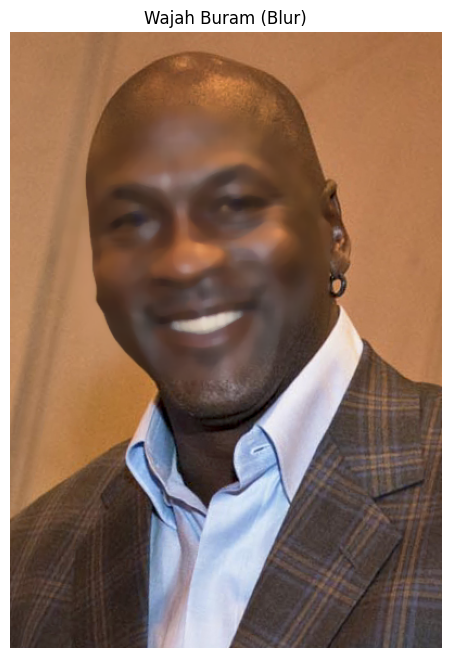

In [43]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur citra yang akan diproses
jalur_citra = '/content/drive/MyDrive/PCVK_img/facedet/mjordan.jpg'

# Memuat citra asli
citra_asli = cv.imread(jalur_citra)

# Memuat cascade classifier untuk deteksi wajah depan
klasifikasi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Mengonversi citra ke skala abu-abu untuk deteksi
citra_abu_abu = cv.cvtColor(citra_asli, cv.COLOR_BGR2GRAY)
# Melakukan deteksi wajah pada citra abu-abu dengan parameter tuning
wajah_terdeteksi = klasifikasi_wajah.detectMultiScale(citra_abu_abu, 1.4, 7, minSize=(50, 50))

# Iterasi melalui setiap wajah yang terdeteksi untuk menerapkan efek blur
for (pos_x, pos_y, lebar, tinggi) in wajah_terdeteksi:
    # Ekstrak area wajah (Region of Interest)
    area_wajah = citra_asli[pos_y:pos_y+tinggi, pos_x:pos_x+lebar]

    # Terapkan blur median pada area wajah
    wajah_buram = cv.medianBlur(area_wajah, 11)

    # Membuat masker elips untuk efek blending yang lebih halus
    masker_elips = np.zeros((tinggi, lebar), dtype=np.uint8)
    pusat = (lebar // 2, tinggi // 2)
    sumbu_elips = (lebar // 2, tinggi // 2)
    cv.ellipse(masker_elips, pusat, sumbu_elips, 0, 0, 360, 255, -1)

    # Menghaluskan tepi masker dengan Gaussian blur untuk efek bulu (feathering)
    masker_elips = cv.GaussianBlur(masker_elips, (21, 21), 11)

    # Normalisasi masker ke rentang 0-1 dan perluas ke 3 saluran warna
    masker_ternormalisasi = masker_elips.astype(float) / 255.0
    masker_3d = np.repeat(masker_ternormalisasi[:, :, np.newaxis], 3, axis=2)

    # Mencampur (blend) wajah asli dan wajah buram menggunakan masker
    area_wajah_float = area_wajah.astype(float)
    wajah_buram_float = wajah_buram.astype(float)
    hasil_campur = (wajah_buram_float * masker_3d + area_wajah_float * (1 - masker_3d)).astype(np.uint8)

    # Ganti area wajah asli dengan hasil campur
    citra_asli[pos_y:pos_y+tinggi, pos_x:pos_x+lebar] = hasil_campur

# Mengonversi citra akhir dari BGR ke RGB untuk tampilan yang benar
citra_tampil_rgb = cv.cvtColor(citra_asli, cv.COLOR_BGR2RGB)

# Menampilkan citra dengan wajah yang telah diburamkan
plt.figure(figsize=(10, 8))
plt.imshow(citra_tampil_rgb)
plt.axis('off')
plt.title('Wajah Buram (Blur)')
plt.show()

### Mengolah gambar KTM masing-masing

Memproses KTM - Ditemukan 1 wajah



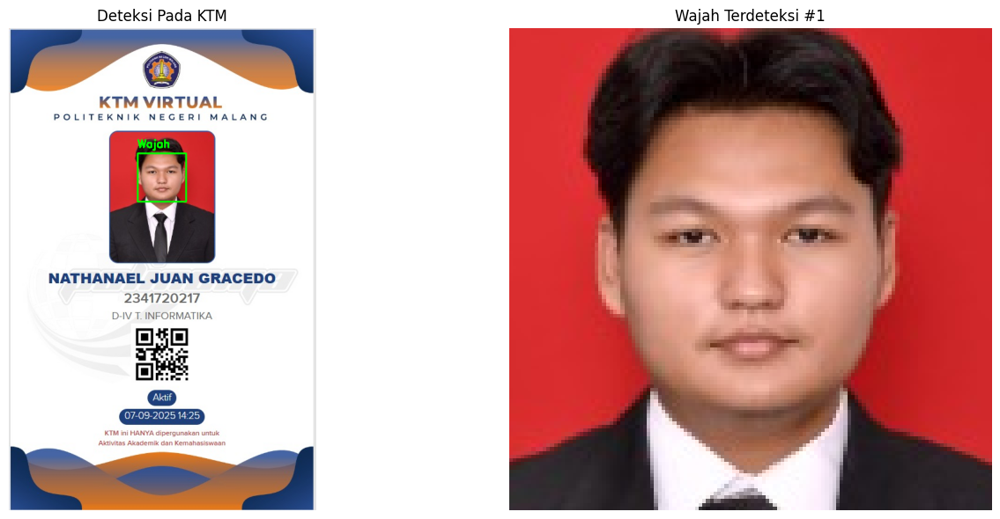

In [46]:
jalur_ktm = '/content/drive/MyDrive/PCVK_img/KTM-JUAN.jpg'
citra_ktm_asli = cv.imread(jalur_ktm)

# Memastikan citra berhasil dimuat
if citra_ktm_asli is None:
    print(f"Error: Gagal memuat citra dari {jalur_ktm}. Pastikan jalur dan nama file benar.")
else:
    citra_ktm_deteksi = citra_ktm_asli.copy()

    klasifikasi_wajah = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

    citra_abu_abu = cv.cvtColor(citra_ktm_asli, cv.COLOR_BGR2GRAY)
    wajah_terdeteksi = klasifikasi_wajah.detectMultiScale(citra_abu_abu, 1.1, 5, minSize=(50, 50))

    print(f"Memproses KTM - Ditemukan {len(wajah_terdeteksi)} wajah\n")

    # Membuat figure dengan subplots untuk menampilkan hasil
    gambar_fig, sumbu_plot = plt.subplots(1, len(wajah_terdeteksi) + 1, figsize=(15, 6))

    # Menampilkan citra KTM asli dengan kotak deteksi
    for (x, y, w, h) in wajah_terdeteksi:
        cv.rectangle(citra_ktm_deteksi, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv.putText(citra_ktm_deteksi, 'Wajah', (x, y-10), cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    sumbu_plot[0].imshow(cv.cvtColor(citra_ktm_deteksi, cv.COLOR_BGR2RGB))
    sumbu_plot[0].set_title('Deteksi Pada KTM')
    sumbu_plot[0].axis('off')

    # Menampilkan wajah yang diekstrak
    for i, (x, y, w, h) in enumerate(wajah_terdeteksi, 1):
        # Menambahkan padding di sekitar wajah untuk konteks
        margin_tambahan = int(w * 0.3)

        koordinat_x_awal = max(0, x - margin_tambahan)
        koordinat_y_awal = max(0, y - margin_tambahan)
        koordinat_x_akhir = min(citra_ktm_asli.shape[1], x + w + margin_tambahan)
        koordinat_y_akhir = min(citra_ktm_asli.shape[0], y + h + margin_tambahan)

        # Mengekstrak wajah dengan latar belakang
        wajah_dengan_latar = citra_ktm_asli[koordinat_y_awal:koordinat_y_akhir, koordinat_x_awal:koordinat_x_akhir]

        # Menampilkan wajah
        sumbu_plot[i].imshow(cv.cvtColor(wajah_dengan_latar, cv.COLOR_BGR2RGB))
        sumbu_plot[i].set_title(f'Wajah Terdeteksi #{i}')
        sumbu_plot[i].axis('off')

    plt.tight_layout()
    plt.show()

**Lakukan Deteksi Obyek KTM pada gambar yang berisi KTM dengan
barang lainnya dengan menggunakan Konsep Feature Matching**

Keypoint Template: 1117
Keypoint Scene: 10239



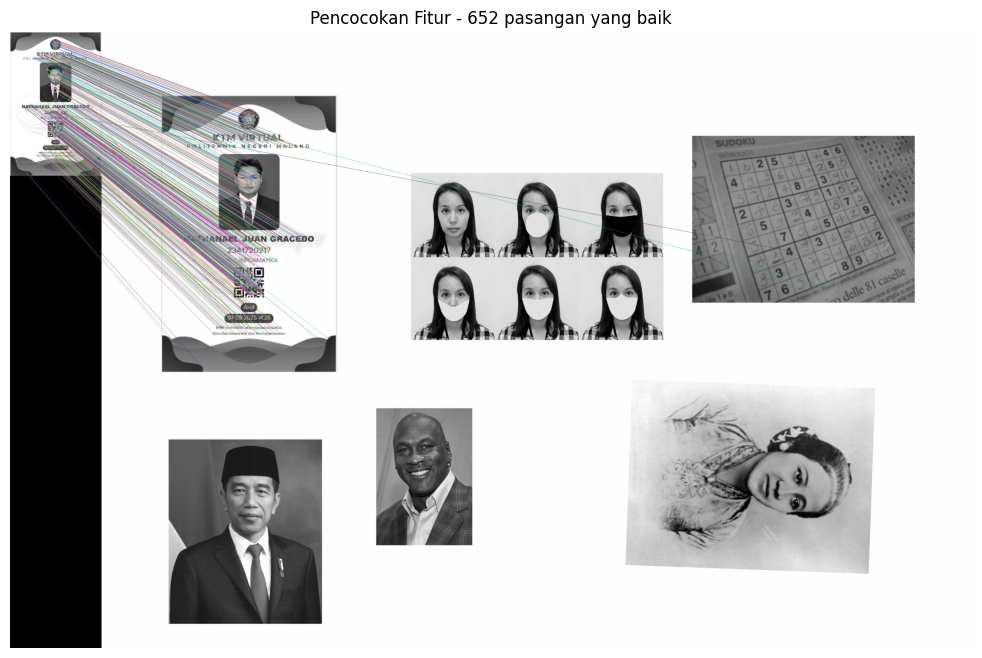

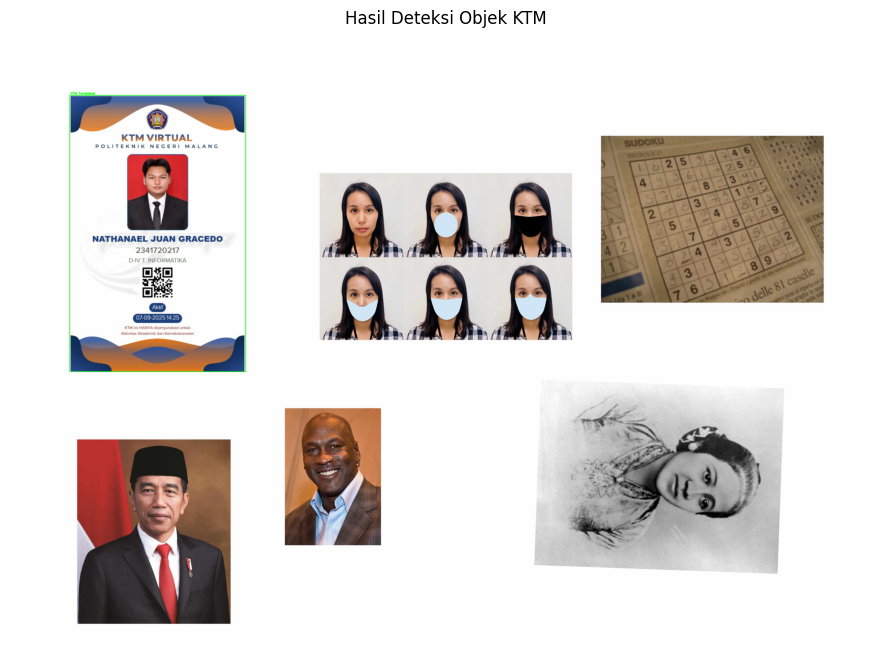

In [49]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

# Mendefinisikan jalur untuk citra template (KTM) dan citra scene (gambar acak)
jalur_template = '/content/drive/MyDrive/PCVK_img/KTM-JUAN.jpg'
jalur_scene = '/content/drive/MyDrive/PCVK_img/random.jpg'

# Memuat citra template dan scene dalam skala abu-abu
citra_template = cv.imread(jalur_template, cv.IMREAD_GRAYSCALE)
citra_scene = cv.imread(jalur_scene, cv.IMREAD_GRAYSCALE)

# Memeriksa apakah citra berhasil dimuat
if citra_template is None or citra_scene is None:
    print("Error: Gagal memuat citra. Pastikan jalur file sudah benar.")
else:
    # 1. Inisialisasi detektor fitur SIFT
    detektor_sift = cv.SIFT_create()

    # 2. Temukan keypoint dan deskriptor pada kedua citra
    keypoints_template, deskriptor_template = detektor_sift.detectAndCompute(citra_template, None)
    keypoints_scene, deskriptor_scene = detektor_sift.detectAndCompute(citra_scene, None)

    print(f"Keypoint Template: {len(keypoints_template)}")
    print(f"Keypoint Scene: {len(keypoints_scene)}\n")

    # 3. Menggunakan pencocok berbasis FLANN untuk menemukan pasangan keypoint terbaik
    FLANN_INDEX_KDTREE = 1
    parameter_indeks = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    parameter_pencarian = dict(checks=50)

    pencocok_flann = cv.FlannBasedMatcher(parameter_indeks, parameter_pencarian)
    pasangan_keypoint = pencocok_flann.knnMatch(deskriptor_template, deskriptor_scene, k=2)

    # 4. Terapkan uji rasio Lowe untuk memfilter pasangan keypoint yang baik
    pasangan_baik = []
    for m, n in pasangan_keypoint:
        if m.distance < 0.7 * n.distance:
            pasangan_baik.append(m)

    # 5. Menggambar pasangan keypoint yang baik
    gambar_pasangan = cv.drawMatches(citra_template, keypoints_template, citra_scene, keypoints_scene, pasangan_baik, None,
                                  flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    plt.figure(figsize=(15, 8))
    plt.imshow(gambar_pasangan, cmap='gray')
    plt.axis('off')
    plt.title(f'Pencocokan Fitur - {len(pasangan_baik)} pasangan yang baik')
    plt.show()

    # 6. Menemukan homografi dan menggambar kotak pembatas
    MIN_MATCH_COUNT = 10

    if len(pasangan_baik) > MIN_MATCH_COUNT:
        # Ekstrak lokasi keypoint dari pasangan yang baik
        titik_sumber = np.float32([keypoints_template[m.queryIdx].pt for m in pasangan_baik]).reshape(-1, 1, 2)
        titik_tujuan = np.float32([keypoints_scene[m.trainIdx].pt for m in pasangan_baik]).reshape(-1, 1, 2)

        # Hitung matriks homografi menggunakan RANSAC
        matriks_h, masker_pasangan = cv.findHomography(titik_sumber, titik_tujuan, cv.RANSAC, 5.0)

        if matriks_h is not None:
            # Dapatkan dimensi template
            tinggi_t, lebar_t = citra_template.shape
            # Tentukan sudut template
            sudut_template = np.float32([[0, 0], [0, tinggi_t-1], [lebar_t-1, tinggi_t-1], [lebar_t-1, 0]]).reshape(-1, 1, 2)
            # Transformasikan sudut template ke scene menggunakan homografi
            sudut_tertransformasi = cv.perspectiveTransform(sudut_template, matriks_h)

            # Baca ulang citra scene dalam warna untuk menggambar kotak
            citra_scene_warna = cv.imread(jalur_scene)
            # Gambar kotak pembatas pada citra scene
            citra_dengan_ktm = cv.polylines(citra_scene_warna, [np.int32(sudut_tertransformasi)], True, (0, 255, 0), 2, cv.LINE_AA)

            # Tambahkan label teks kecil
            cv.putText(citra_dengan_ktm, 'KTM Terdeteksi', (int(sudut_tertransformasi[0][0][0])+5, int(sudut_tertransformasi[0][0][1])-5),
                       cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

            plt.figure(figsize=(12, 8))
            plt.imshow(cv.cvtColor(citra_dengan_ktm, cv.COLOR_BGR2RGB))
            plt.axis('off')
            plt.title('Hasil Deteksi Objek KTM')
            plt.show()

        else:
            print("❌ Matriks Homografi tidak ditemukan")
    else:
        print(f"❌ Tidak ada pasangan yang cukup: {len(pasangan_baik)}/{MIN_MATCH_COUNT}")